# Text Document Pre-Processing, Segmentation & Structure Analysis for OCR

Based on an article by Archana A. Shinde (Department of Computer Science & Engineering, KIT COEK, Kolhapur) and D.G.Chougule (Department of Computer Science & Engineering, TKIET, Warananagar)

In [219]:
import PIL
from PIL import Image
from PIL import ImageDraw
import numpy as np
import matplotlib.pyplot as plt
import utils
import preprocessing as pp

from skimage.color import rgb2gray
from skimage import io as skio

## Preprocessing

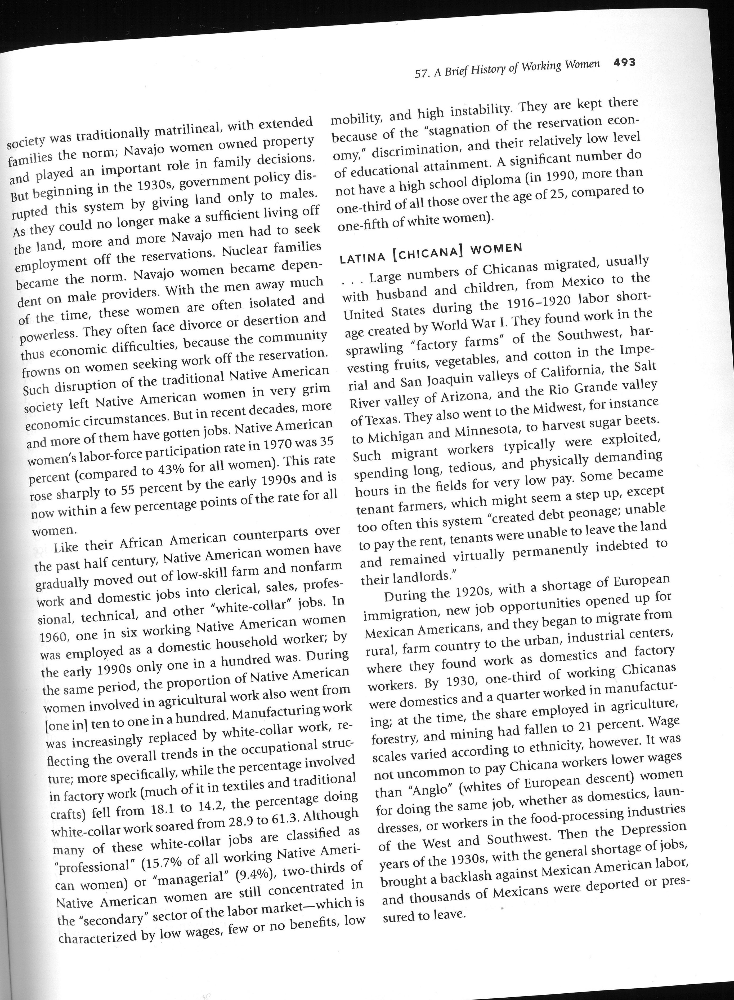

In [224]:
file = "data/crooked-scan.png"
original = utils.imread(file)
original

In [225]:
image = np.array(original)

In [226]:
#To Grayscale
from skimage.color import rgb2gray
gray = rgb2gray(image)

<ipython-input-226-7a2ee3d266fe>:3: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  gray = rgb2gray(image)


In [227]:
#Median filter -> reducing noise

gray = utils.median_filter(gray, r = 1)

AttributeError: module 'utils' has no attribute 'median_filter'

### 1 : Binarisation

Avec la méthode de segmentation d'Otsu (efficace pour séparer 2 classes de pixels)

In [210]:
from skimage.filters import threshold_local

In [211]:
block_size = 13
local_thresh = threshold_local(gray, block_size, offset=10)
binary_local = gray > local_thresh

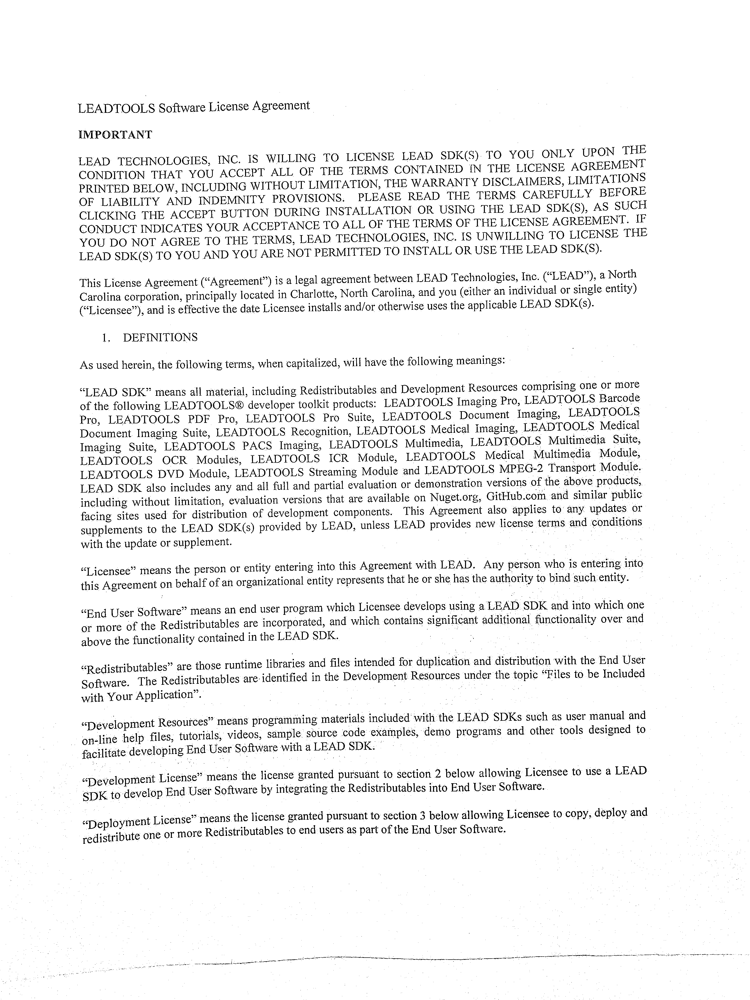

In [212]:
binarized = Image.fromarray(binary_local)
binarized

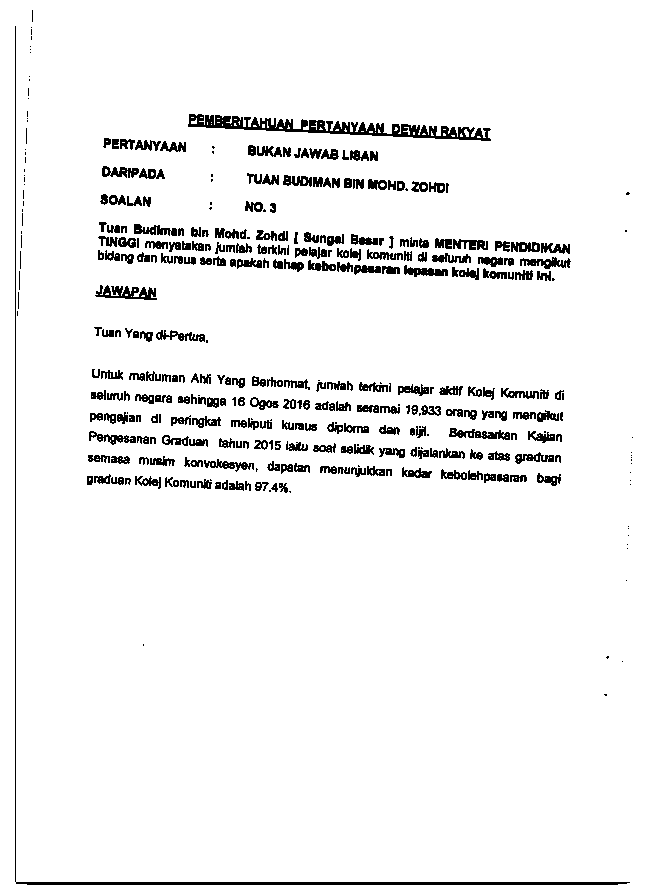

In [391]:
bin_simple = Image.fromarray(gray > 200)
bin_simple

In [392]:
np.array(bin_simple).shape

(889, 647)

In [173]:
gray_PIL = Image.fromarray(gray)

## 2 : Edge & Skew correction

In [174]:
def rotation_PIL(im, theta):
    """
    Effectue la rotation de theta radiants de l'image en prenant le centre de l'image comme centre de rotation
    :param im: PIL.Image.Image image
    :param theta: float angle de rotation en radiants

    :return: PIL.Image.Image
    """
    return im.rotate(theta * 180 / np.pi, resample=PIL.Image.BICUBIC, fillcolor=255)

In [175]:
def crop(im, size):
    """
    découpe un carré ou rectangle au centre de l'image, de dimension(s) size. Si size est un entier, il est utilisé
    à la fois pour la longueur et la largeur.

    :param im: PIL.Image.Image
    :param size: (int, int) or int
    :return:
    """
    M, N = im.size[0] // 2, im.size // 2
    if isinstance(size, tuple):
        L, K = size[0] // 2, size[1] // 2
        return im.crop((N - L, M - K, N + L, M + K))
    else:
        L = size // 2
        return im.crop((N - L, M - L, N + L, M + L))

In [176]:
def quadrants(im):
    """
    Divise l'image en quadrants
    :param im: 2D array image
    :return:
    """
    N, M = im.shape
    yield im[:N // 3, :M // 2]
    yield im[:N // 3, M // 2:]
    yield im[N*2 // 3:, :M // 2]
    yield im[N*2 // 3:, M // 2:]

In [177]:
def middle_square(shape, n, m=None):
    """
    Crée une matrice de uns à l'exception d'un rectangle de zéros de taille 2n * 2m au milieu recouvrant également
    chaque quadrant

    :param shape: (int, int) dimension de la matrice renvoyée
    :param n: int hauteur du rectangle. Si m n'est pas utilisé, n est également la largeur.
    :param m: (optionnel) largeur du rectangle
    :return: 2D array
    """
    if not m:
        m = n
    N, M = shape
    res = np.ones(shape) * 255
    res[N // 2 - n:N // 2 + n, M // 2 - m:M // 2 + m] = 0
    return res

In [178]:
def find_brightest_pixels(image, N):
    """
    trouve les positions des N pixels les plus brillants de l'image
    :param image: 2D array
    :param N: int
    :return:
    """
    image_1d = image.flatten()
    idx_1d = image_1d.argsort()[-N:]
    x_idx, y_idx = np.unravel_index(idx_1d, image.shape)
    return x_idx, y_idx

In [179]:
from sklearn.linear_model import HuberRegressor, LinearRegression
import warnings

def find_skew_angle(a, pixel_used=30):
    """
    Trouve l'angle de rotation de l'image en fittant une droite sur les points les plus lumineux
    de la transformée de fourier
    :param a: 2D array
    :param pixel_used: int nombre de pixels utilisés pour fitter la droite
    :return:
    """
    A = np.fft.fftshift(np.fft.fft2(a))
    coef = []
    for quad in quadrants(np.log(np.abs(A) + 1) * middle_square(A.shape, pixel_used)):
        X, y = find_brightest_pixels(quad, pixel_used)
        reg = HuberRegressor().fit(X.reshape(-1, 1), y)
        R2 = reg.score(X.reshape(-1, 1), y)
        if R2 > 0.8:
            coef.append(reg.coef_)
    if len(coef) == 0:
        warnings.warn("Peu de confiance en l'angle de rotation")
        for quad in quadrants(np.log(np.abs(A) + 1) * middle_square(A.shape, pixel_used)):
            X, y = find_brightest_pixels(quad, pixel_used)
            reg = HuberRegressor().fit(X.reshape(-1, 1), y)
            coef.append(reg.coef_)

    correct = A.shape[1] / A.shape[0]  # distortion de l'angle si l'image n'est pas carrée

    return np.arctan(np.mean(coef) / correct)

In [180]:
def view_image(im, figsize=(10, 10)):
    """
    Permet de lire une image en niveaux de gris

    :param im: np.array image
    :param figsize: (float, float) taille de l'image affichée
    :return:
    """
    plt.figure(figsize=figsize)
    plt.imshow(im, 'Greys_r')
    plt.axis('off')
    plt.show()

In [181]:
image = gray_PIL

In [186]:
fourier = np.fft.fftshift(np.fft.fft2(gray))
A =np.multiply(np.log(np.abs(fourier)+1), middle_square(fourier.shape, 100)/255)

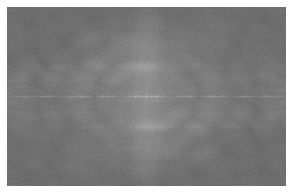

In [187]:
B= np.log(np.abs(fourier)+1)
view_image(B, figsize=(5, 5))

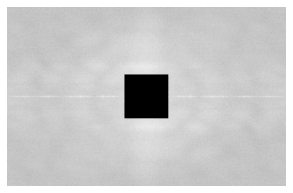

In [188]:
view_image(A, figsize=(5, 5))

In [245]:
from skimage.transform import hough_line, hough_line_peaks
from skimage.feature import canny
from scipy.stats import mode

def find_skew_angle_hough(im, plot = False):
    edges = canny(im)
    angles = np.deg2rad(np.arange(0.1, 180.0)) #on veut des radians
    h, theta, d = hough_line(edges, theta=angles)
    accum, angles, dists = hough_line_peaks(h, theta, d)

    #to plot the lines on the image
    if plot:
        fig, axes = plt.subplots(1, 2, figsize=(15, 16))
        ax = axes.ravel()
        ax[0].imshow(im, cmap="gray")
        ax[0].set_title('Image')
        ax[0].set_axis_off()
        ax[1].imshow(edges, cmap="gray")
        origin = np.array((0, im.shape[1]))
        for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
            y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
            ax[1].plot(origin, (y0, y1), '-r')
        ax[1].set_xlim(origin)
        ax[1].set_ylim((edges.shape[0], 0))
        ax[1].set_axis_off()
        ax[1].set_title('Lignes de Hough')

    return mode(np.around(angles, decimals=2))[0] - np.pi/2

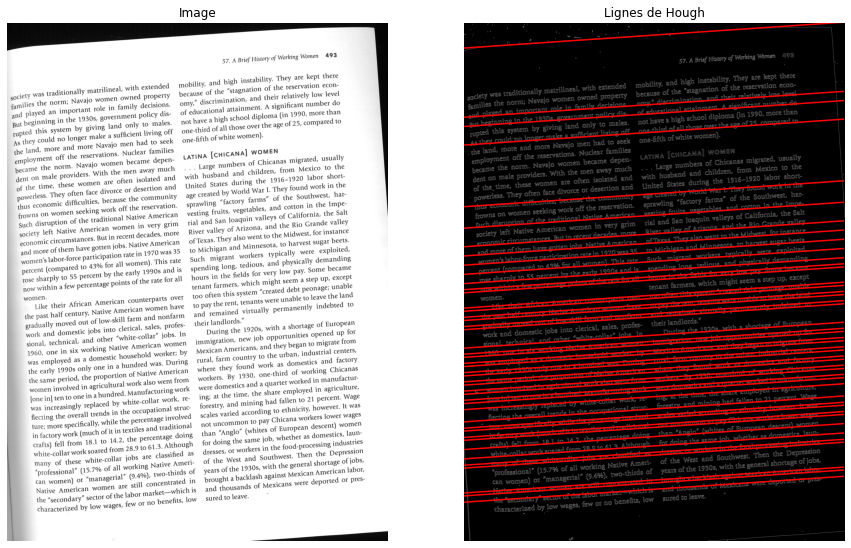

In [246]:
#skew correction with hough

theta_hough = find_skew_angle_hough(gray, plot = True)

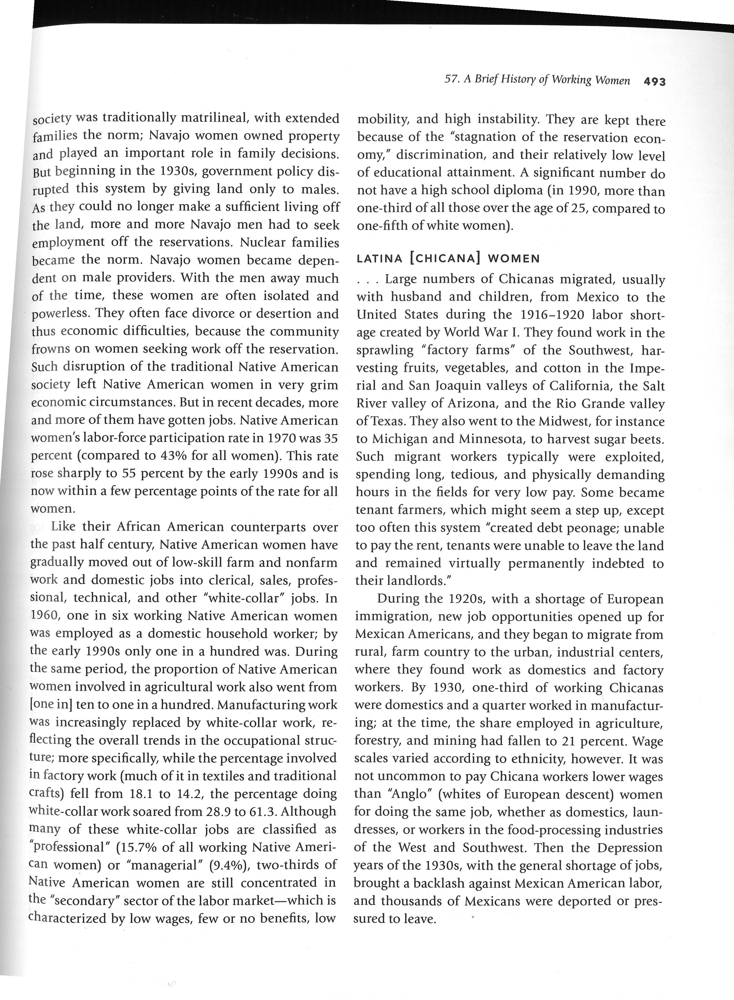

In [247]:
#skew correction with Hough

aligned_with_hough = rotation_PIL(original, theta_hough)
aligned_with_hough

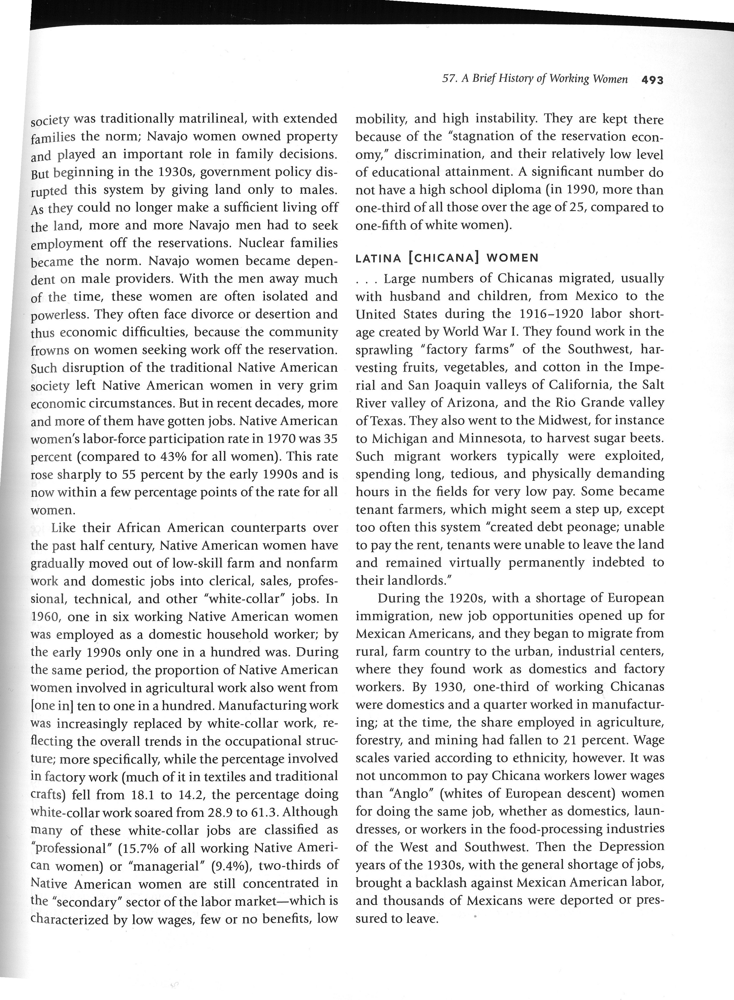

In [249]:
#skew correction
theta = find_skew_angle(image)
aligned = rotation_PIL(original, -theta)
aligned

In [190]:
theta

-0.03861460801428901

In [39]:
sl = 0.95

im = np.array(aligned)
white_density = im.sum(axis=-1)
text_line = white_density < sl * white_density.max()

In [49]:
view = white_density/np.max(white_density)*255
view = view.astype(int)
view

array([248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248, 248,
       247, 247, 247, 249, 249, 250, 251, 252, 252, 254, 255, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 249, 214, 190, 197, 197, 188, 189, 198, 200, 202,
       220, 181, 170, 228, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 240, 217, 213, 214, 209, 208, 208,
       208, 208, 225, 248, 254, 254, 254, 254, 254, 254, 254, 254, 254,
       254, 254, 254, 254, 254, 254, 254, 254, 241, 207, 197, 20

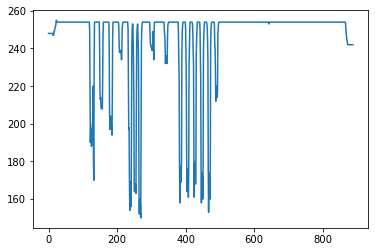

In [51]:
plt.plot(view)

In [55]:
def otsu(im):
    h = histogram(im)

    m = 0
    for i in range(256):
        m = m + i * h[i]

    maxt = 0
    maxk = 0

    for t in range(256):
        w0 = 0
        w1 = 0
        m0 = 0
        m1 = 0
        for i in range(t):
            w0 = w0 + h[i]
            m0 = m0 + i * h[i]
        if w0 > 0:
            m0 = m0 / w0

        for i in range(t, 256):
            w1 = w1 + h[i]
            m1 = m1 + i * h[i]
        if w1 > 0:
            m1 = m1 / w1

        k = w0 * w1 * (m0 - m1) * (m0 - m1)

        if k > maxk:
            maxk = k
            maxt = t

    thresh = maxt

    return ((im > thresh) * 255).astype(np.uint8)

In [58]:
def histogram(im):
    nl, nc = im.shape

    hist = np.zeros(256)

    for i in range(nl):
        for j in range(nc):
            hist[im[i][j]] = hist[im[i][j]] + 1

    for i in range(256):
        hist[i] = hist[i] / (nc * nl)

    return hist

In [61]:
from PIL.ImageFilter import GaussianBlur

def segmentation(image, r=1, sl=0.95, sw=0.98):
    """
    Effectue la segmentation de l'image et renvoie une nouvelle image entourant les mots
    dans des rectangles de différentes couleurs

    :param sw: seuil de segmentation des mots
    :param sl: seuil de segmentation des lignes
    :param r: rayon du noyau gaussien utilisé pour segmenter les mots
    :param image: PIL.Image.Image
    :return:
    """
    numpy_image = np.array(image)

    binary = otsu(numpy_image)
    binary_PIL = PIL.Image.fromarray(binary)

    blurred = np.array(binary_PIL.filter(GaussianBlur(radius=r)))

    res = image.copy().convert('RGBA')
    mask = PIL.Image.new('RGBA', res.size, color=(255, 255, 255, 0))
    draw = PIL.ImageDraw.Draw(mask)
    colors = colors_generator()

    n, m = binary.shape

    for u, v in analysis.cut_lines(binary, sl):
        for k, l in analysis.cut_words(blurred[u:v], sw):
            #  yield u, k, v, l
            if u > 0 and v < n and k > 0 and l < m:
                draw.rectangle(((k, u), (l, v)), fill=next(iter(colors)))
    res.alpha_composite(mask)
    return res

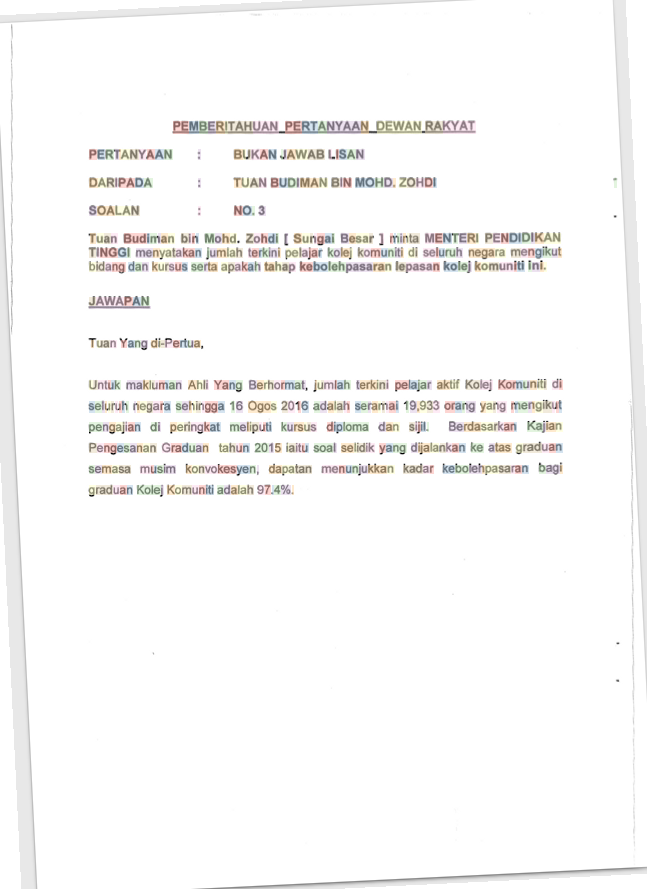

In [67]:
utils.segmentation(aligned, r = 0.1, sw = 0.8)

In [403]:
#retire le bas de l'image (pour le test)
width, height = binarized.size

left = width/5
top = height/5
right = width - width/5
bottom = height - height/5
 
im1 = binarized.crop((left, top, right, bottom))
im1.show()

In [404]:
def median_filter(im,typ=1,r=1,xy=None):
    """ renvoie le median de l'image im.
    si typ==1 (defaut) le median est calcule sur un carre de cote 2r+1
    si typ==2 : disque de rayon r
    si typ==3 alors xy est un couple de liste de x et liste de y
         ([-1,0,1] , [0,0,0]) donne un median sur un segment horizontql de taille trois. 
         """
    lx=[]
    ly=[]
    (ty,tx)=im.shape
    if typ==1: #carre
        
        for k in range(-r,r+1):
            for l in range(-r,r+1):
                lx.append(k)
                ly.append(l)
        
    elif typ==2:
        for k in range(-r,r+1):
            for l in range(-r,r+1):
                if k**2+l**2<=r**2:
                    lx.append(k)
                    ly.append(l)
    else: #freeshape
        lx,ly=xy
    
    debx=-min(lx) #min is supposed negatif
    deby=-min(ly)
    finx=tx-max(lx) #max is supposed positif
    finy=ty-max(ly)
    ttx=finx-debx
    tty=finy-deby
    tab=np.zeros((len(lx),ttx*tty))
    #print (lx,ly)
    #print(ttx,tty)
    #print(im[deby+ly[k]:tty+ly[k]+deby,debx+lx[k]:debx+ttx+lx[k]].reshape(-1).shape)
    for k in range(len(lx)):
        tab[k,:]=im[deby+ly[k]:deby+tty+ly[k],debx+lx[k]:debx+ttx+lx[k]].reshape(-1)
    out=im.copy()
    out[deby:finy,debx:finx]=np.median(tab,axis=0).reshape((tty,ttx))
    return out

In [405]:
from skimage.feature import canny
im1 = canny(np.array(im1))

In [406]:
#tests

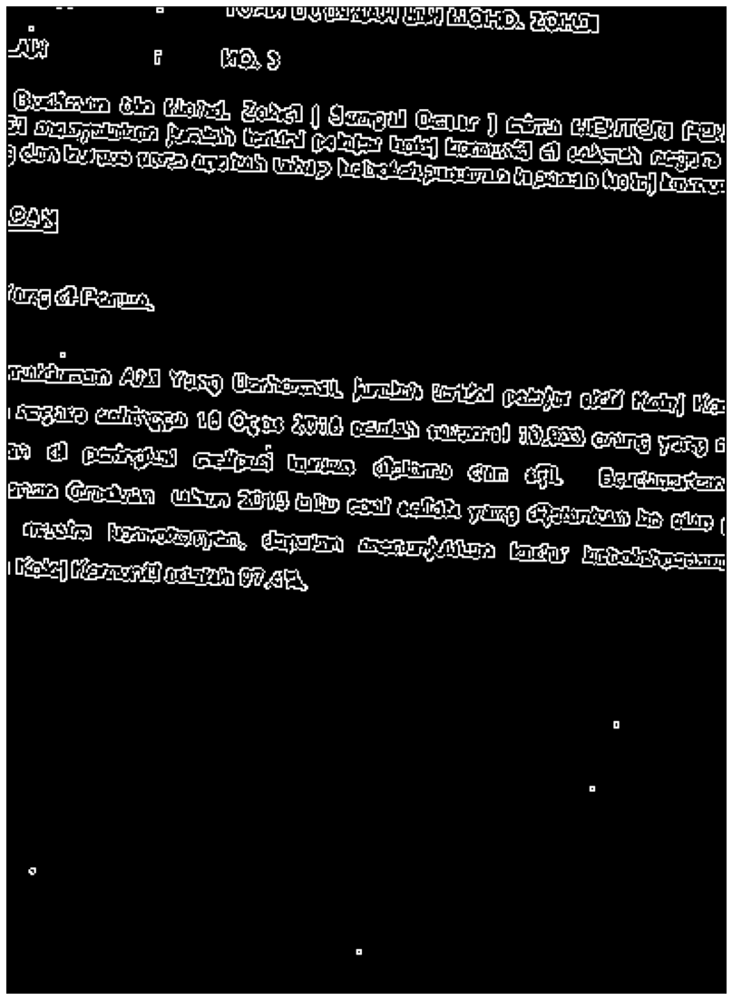

In [408]:
view_image(im1, (20,20))

In [409]:
fourier = np.fft.fftshift(np.fft.fft2(im1))
A =np.multiply(np.log(np.abs(fourier)+1), middle_square(fourier.shape, 20)/255)

In [410]:
middle_square(A.shape, 20)/255

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

In [411]:
A

array([[3.82445702, 3.09047823, 3.66310165, ..., 3.58128005, 4.11531801,
        2.98245262],
       [3.24855436, 4.10408209, 3.77354261, ..., 2.30667689, 3.83679326,
        3.62164252],
       [2.85883097, 3.99544489, 4.44353081, ..., 3.27130112, 3.69370851,
        3.61975024],
       ...,
       [3.61975024, 3.69370851, 3.27130112, ..., 4.44353081, 3.99544489,
        2.85883097],
       [3.62164252, 3.83679326, 2.30667689, ..., 3.77354261, 4.10408209,
        3.24855436],
       [2.98245262, 4.11531801, 3.58128005, ..., 3.66310165, 3.09047823,
        3.82445702]])

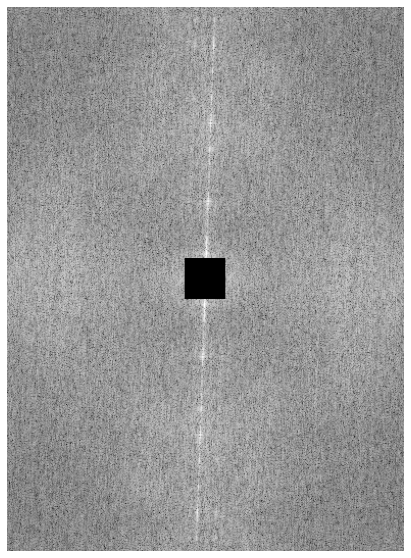

In [412]:
view_image(A, figsize=(10, 10))

In [413]:
X, y = find_brightest_pixels(A, 30)

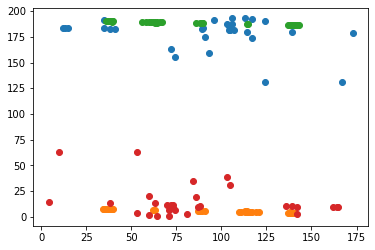

In [414]:
for quad in quadrants(A):
    X, y = find_brightest_pixels(quad, 30)
    plt.scatter(X,y)

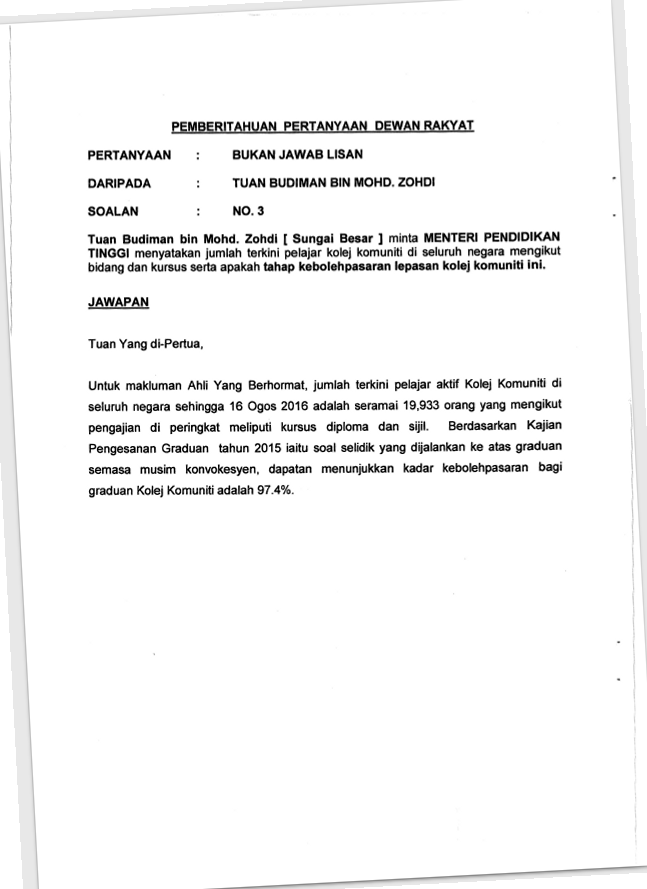

In [433]:
theta =  find_skew_angle(im1)
aligned = rotation_PIL(original, -theta)
aligned

In [225]:
unfiltered = np.array(im1)

In [228]:
filtering = median_filter(unfiltered)

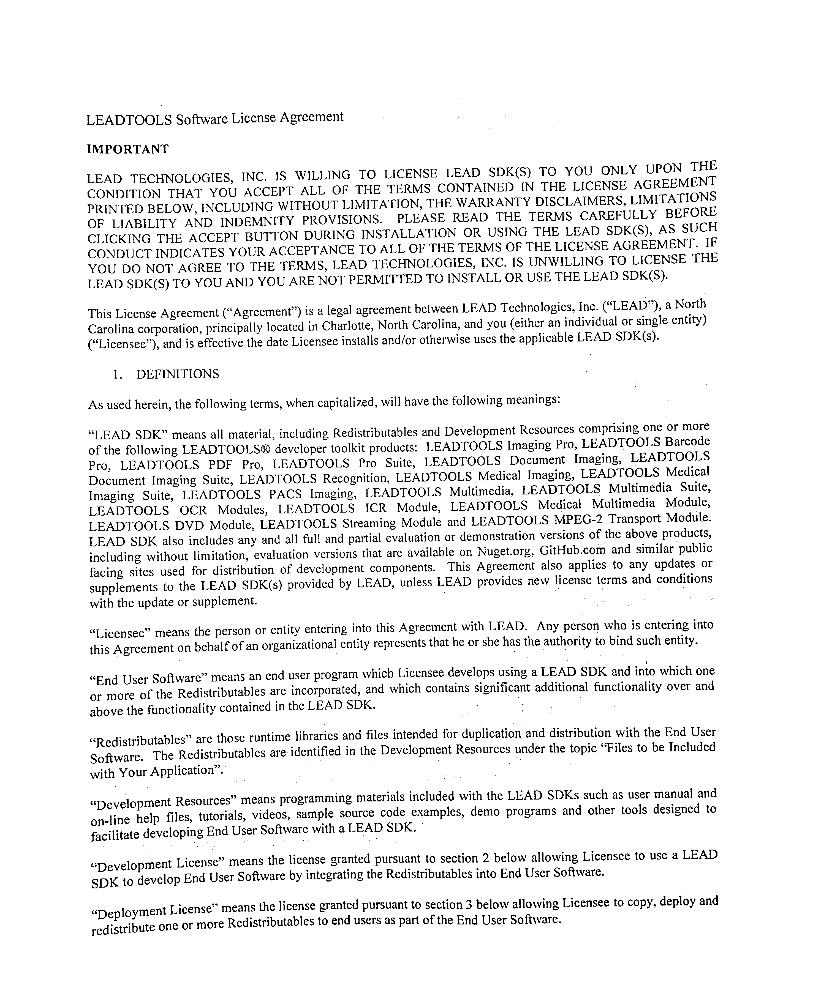

In [229]:
filtered = Image.fromarray(filtering)
filtered

/Users/lucashommet/Desktop/Projects/Text-Segmentation/utils.py:123: UserWarning: Peu de confiance en l'angle de rotation
  warnings.warn("Peu de confiance en l'angle de rotation")


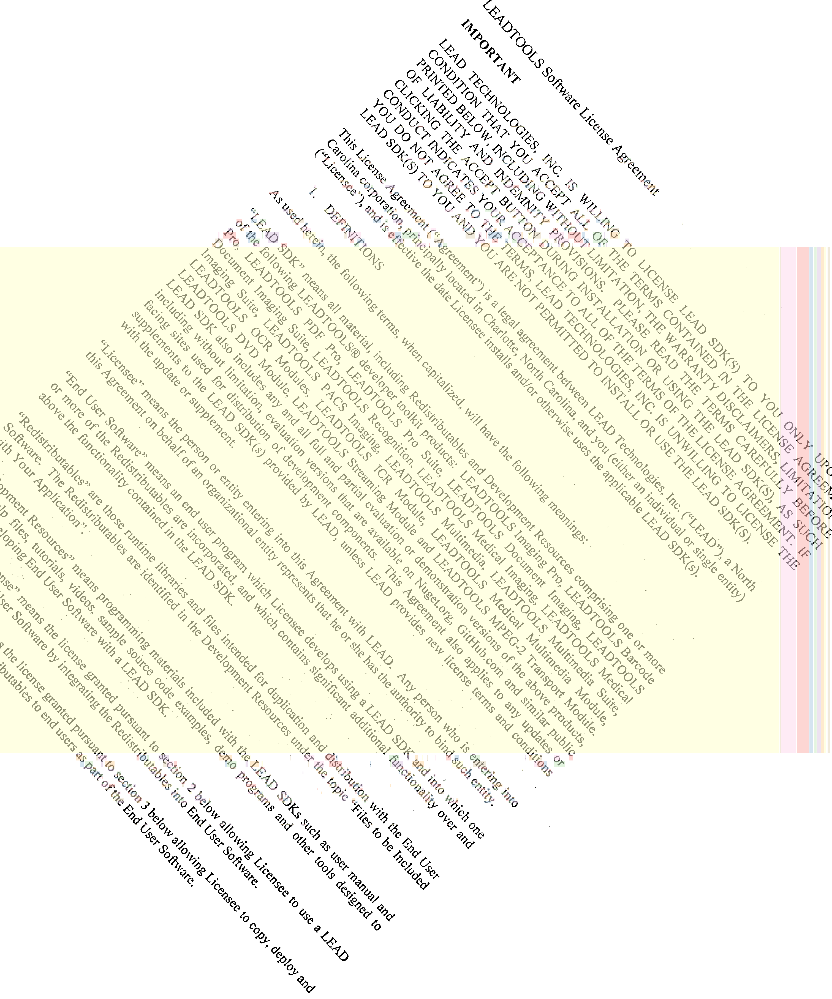

In [230]:
utils.segmentation(filtered)